### Panchy et al. 2022

In [2]:
import os
import csv
import numpy as np
import pandas as pd

import openpyxl
import phate
from scipy.sparse import csr_matrix, csc_matrix # tocsr command import
from scipy import io

%matplotlib inline

import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import scanpy as sc

# Scanpy params
sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=80, figsize=[5,5])
plt.rcParams['figure.figsize']=(5,5)
plt.ioff();

In [3]:
currDir = os.getcwd()

In [4]:
currDir

'/Users/meilumcd/Desktop/EMT-in-cancer/6-Panchy/Code'

directory paths & file names

In [5]:
### DIRECTORY PATHS ###
# Start in "EMT-in-cancer/6-Panchy/Code" folder

# Main dataset directory
mainDir = os.path.dirname(os.path.dirname(currDir))

# Data directories
dataDir = os.path.dirname(mainDir)+"/EMT-in-cancer-datafiles/6-Panchy/_h5ad/"
rawDir = os.path.dirname(mainDir)+"/EMT-in-cancer-datafiles/6-Panchy/_rawData/"

# Figure directory
figDir = os.path.dirname(currDir)+"/Figures/"
sc.settings.figdir = figDir

# Data summaries/output directory
dataSumDir = os.path.dirname(currDir)+"/DataSummaries/"

# EMT marker directory
emtMarkerDir = mainDir+"/Cross-Dataset Comparisons/Markers/"

In [6]:
### FILE PATHS ###

# Files: Raw data names from GEO
raw_data = "GSM6593509_matrix.mtx"
raw_genes = "GSM6593509_genes.tsv"
raw_cells = "GSM6593509_barcodes.tsv.gz"
raw_metadata = "GSM6593509_Concentration_GBC_annotation_Samples.csv.gz"

# Files: cell cycle markers
cellCycle_g1S_csv = "Cell Cycle Markers - G1,S Genes.csv"
cellCycle_g2M_csv = "Cell Cycle Markers - G2,M Genes.csv"

# Files: EMT markers
msigdbMarkersCsv = "Markers - MSigDB.csv"
panglaoMarkersCsv = "Markers - PanglaoDB, Epithelial.csv"
empCookMarkersCsv = "Markers - EMP Cook 2021.csv"

### Part 1: IMPORT DATA, FILTERING, AND NORMALIZATION

In [7]:
# Import genes, cells, metadata

genes = pd.read_csv(rawDir+raw_genes, header=None)
# Crop the Ensembl gene IDs from the gene name
genes = genes[0].str.split('\t').str[1].to_list()

cells = pd.read_csv(rawDir+raw_cells, header=None)[0].to_list()
metadata = pd.read_csv(rawDir+raw_metadata, index_col=0)

In [8]:
# Import data files

# Importing from mtx takes a while; re-saved it as h5ad
# adata_raw = sc.read_mtx(rawDir+raw_data).T
# adata_raw.write(dataDir+"0-rawMtx.h5ad")
adata = sc.read_h5ad(dataDir+"0-rawMtx.h5ad")
adata.var.index = genes
adata.var_names_make_unique()
adata.var_names = adata.var_names.str.upper() # Gene names as all uppercase
adata.obs.index = cells
# adata.X = adata.X.tocsr() # Is this necessary? type() already says csr matrix

In [9]:
# Filter for only cells that have barcodes
# NOTE: these are cells that are filtered by the orig authors!
adata = adata[adata.obs.index.isin(metadata.index)].copy()

# Add the barcodes
adata.obs['Dose Barcode'] = metadata['Values']
# Annotate dosage info
labelDict = {1: 0,
             2: 12.5,
             3: 25,
             4: 50,
             8: 100,
             9: 200,
             12: 400,
             13: 800}
adata.obs["Dose pM"] = adata.obs["Dose Barcode"].replace(to_replace=labelDict)

In [10]:
# Remove Dose 0 cells
adata = adata[adata.obs["Dose pM"] != 0]

KRT15 cells

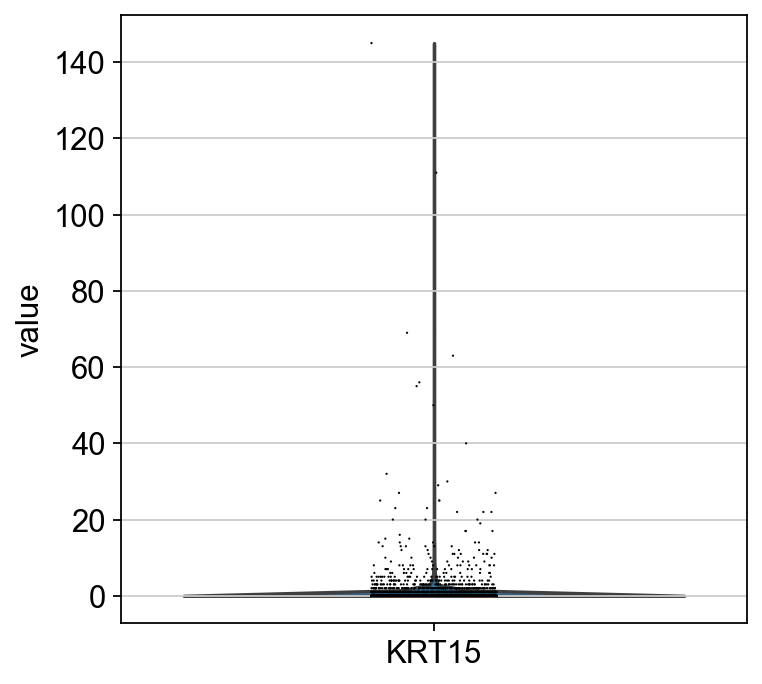

In [11]:
# Remove high KRT15 cells; they are high also in Dose 0, cluster together, maybe misbarcoded Dose 0
sc.pl.violin(adata, ["KRT15"])

In [12]:
# From analysis of all cells
KRT15_high_cells = pd.read_csv("KRT15_expressionHigh_cells.csv", header=None)[0].to_list()
adata = adata[~adata.obs_names.isin(KRT15_high_cells)].copy()
KRT15_low_cells = (~(adata[:, 'KRT15'].X > 20).toarray().flatten()).tolist()
adata = adata[KRT15_low_cells].copy()

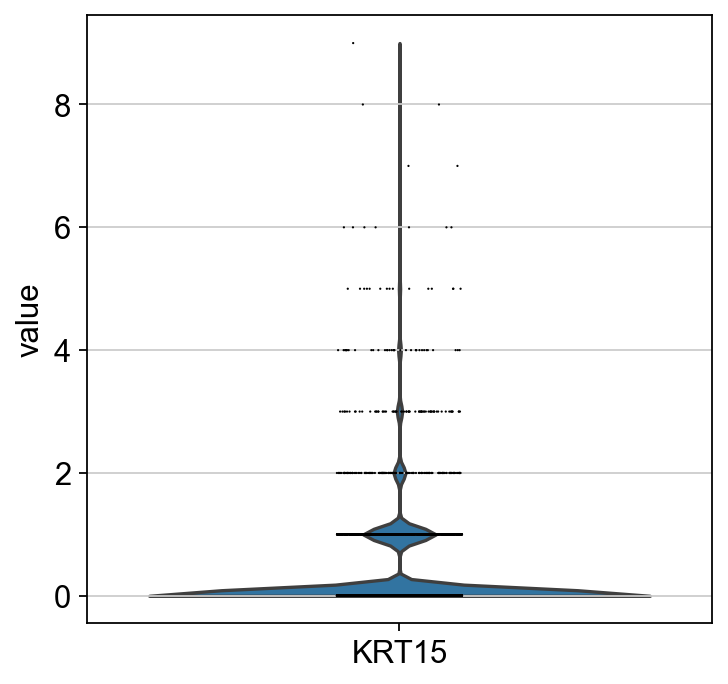

In [13]:
# View KRT15 distribution
sc.pl.violin(adata, ["KRT15"])

FILTERING

In [14]:
# Remove ERCC genes
ercc_genes = adata.var_names.str.startswith('ERCC')
adata = adata[:, ercc_genes==False].copy()

# Filter for minimum cells and genes
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

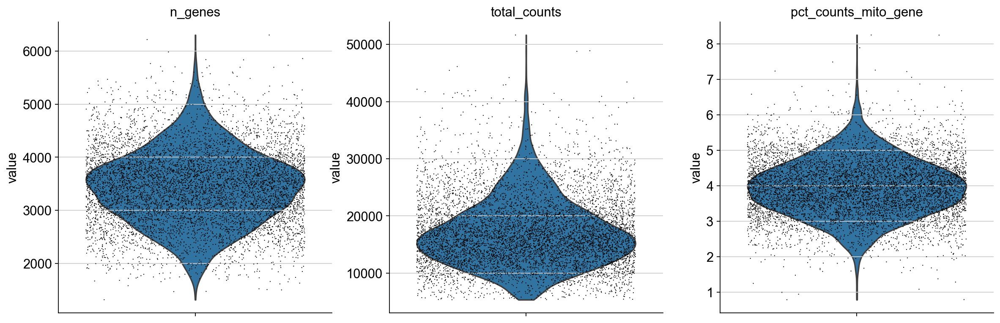

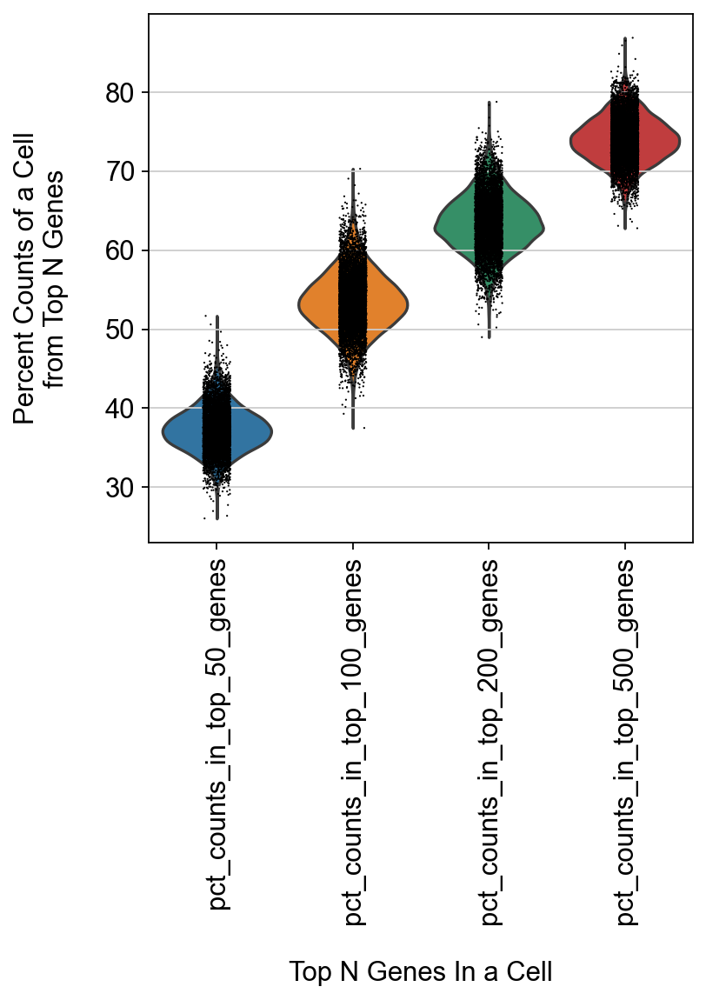

In [15]:
# Identify mitochondrial genes
adata.var['mito_gene'] = adata.var.index.str.startswith(('MT-', 'MTRNR'))

# Run QC metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=['mito_gene'], log1p=False, inplace=True)

# Basic metrics
sc.pl.violin(adata, ['n_genes', 'total_counts', 'pct_counts_mito_gene'], multi_panel=True, jitter=0.4, save=" - n_genes, n_counts, perc_mito.png")

# Top N genes constituting what fraction of total counts, per cell
sc.pl.violin(adata, ['pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'],
             rotation=90, ylabel='Percent Counts of a Cell\nfrom Top N Genes\n', xlabel='\nTop N Genes In a Cell',
             save=" - pct_counts_in_top_n_genes.png")
# Deleting this obs to remove clutter
del adata.obs['pct_counts_in_top_50_genes'], adata.obs['pct_counts_in_top_100_genes'], adata.obs['pct_counts_in_top_200_genes'], adata.obs['pct_counts_in_top_500_genes']

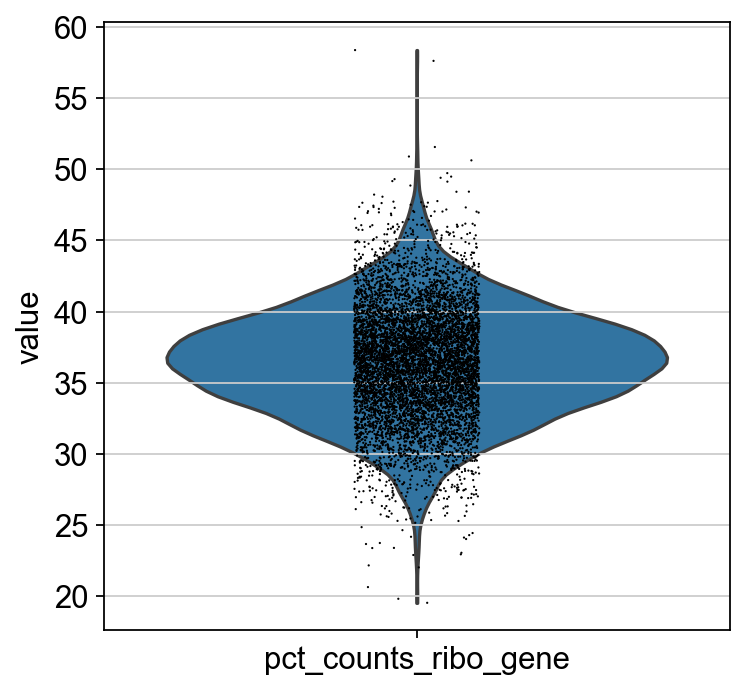

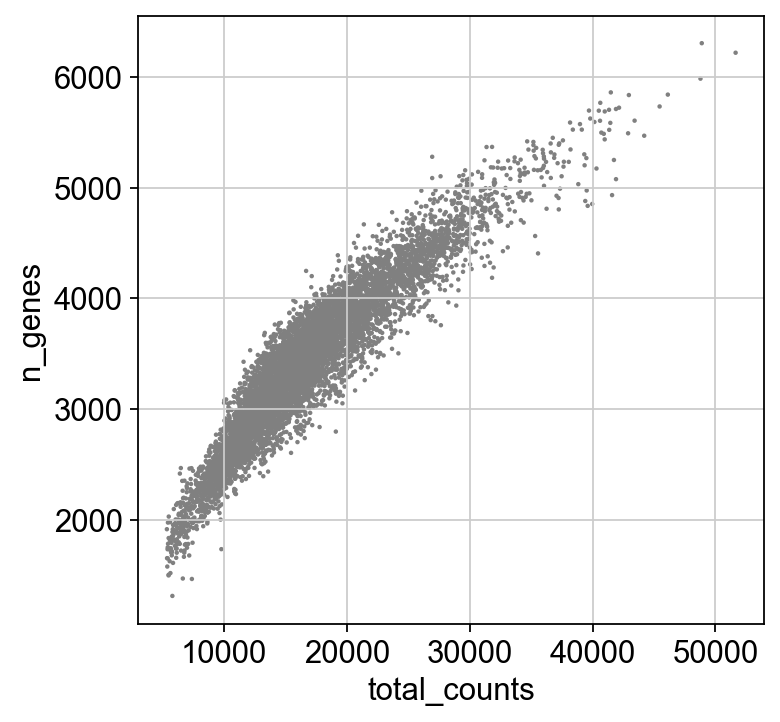

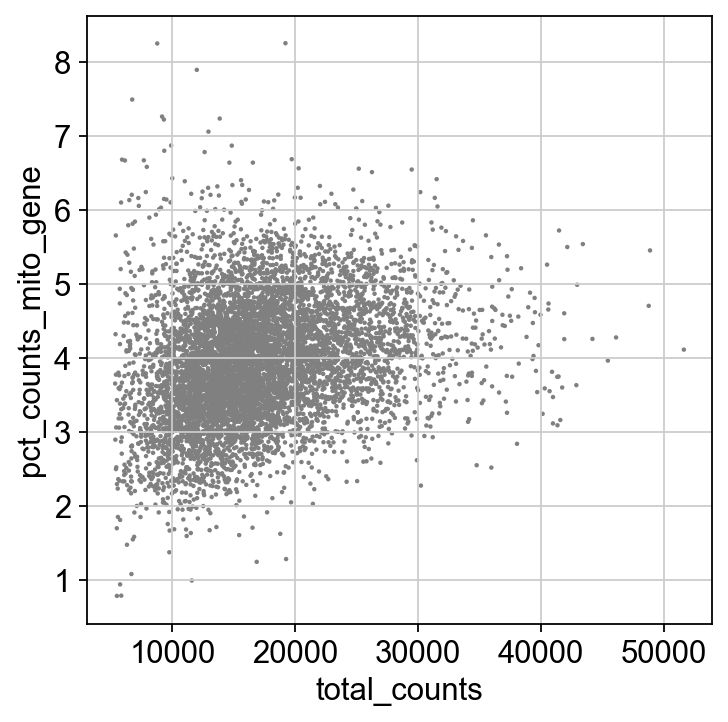

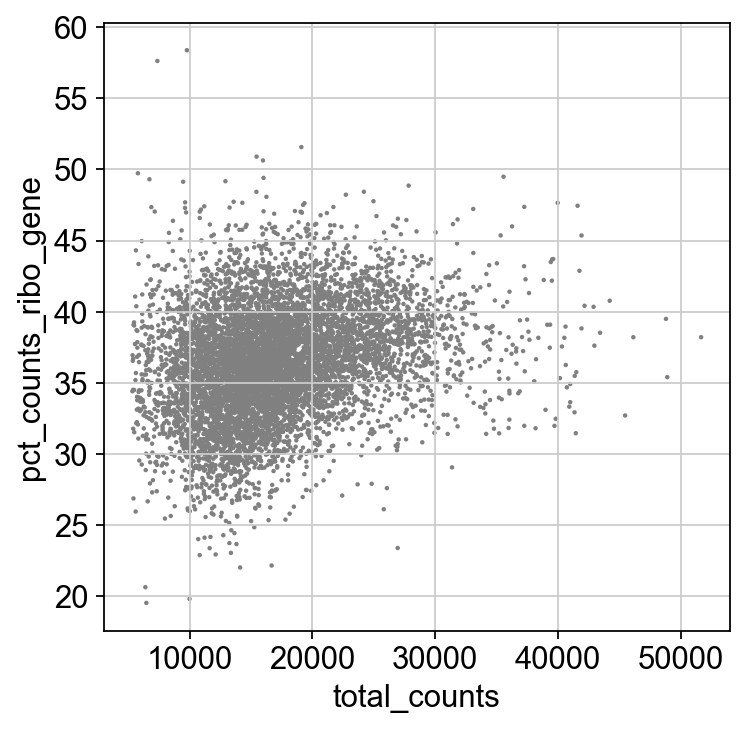

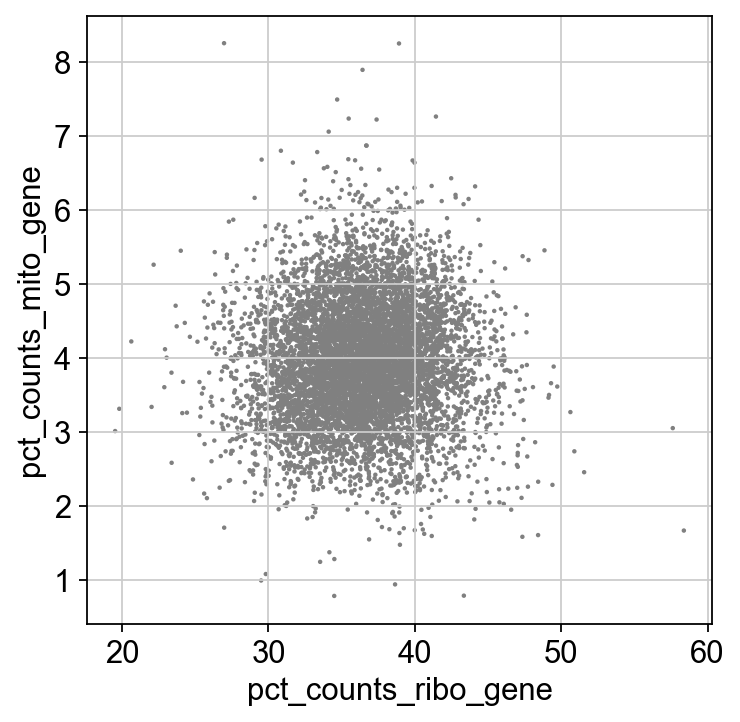

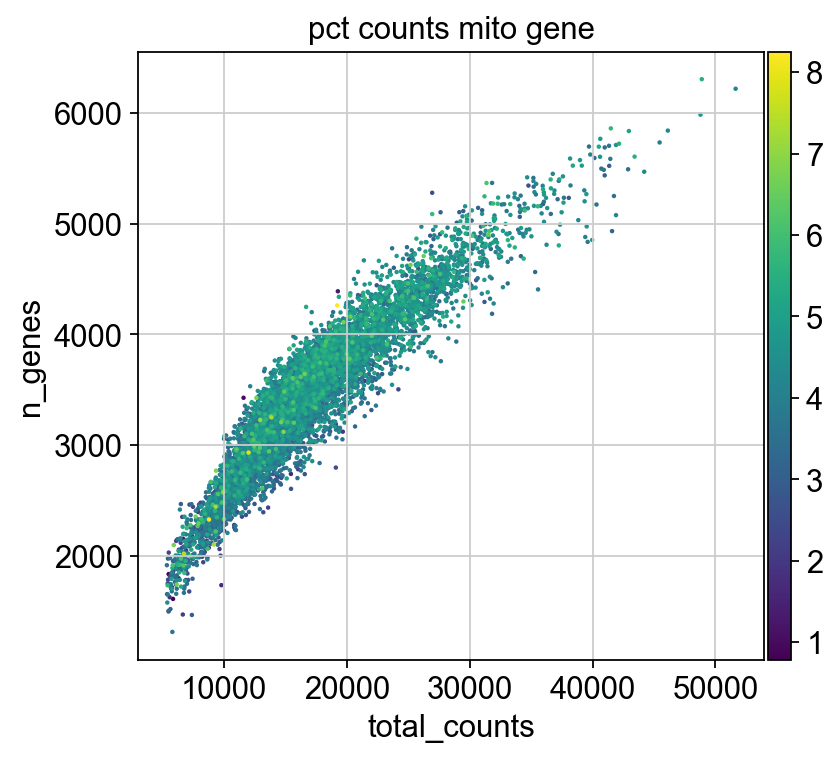

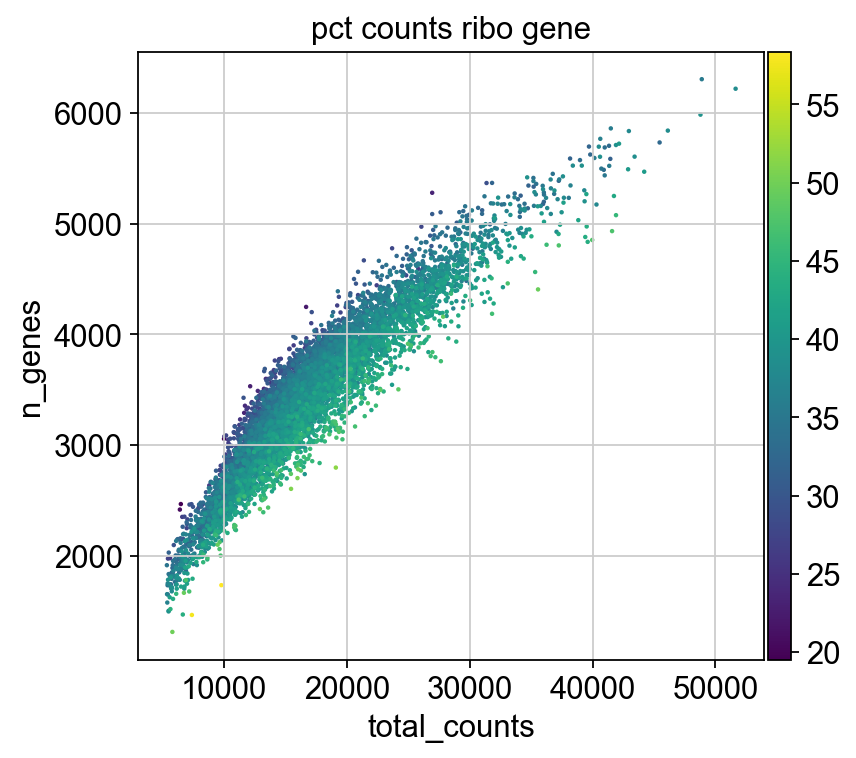

In [16]:
# Identify ribosomal genes
ribo_genes = adata.var.index.str.startswith(('RPL','RPS'))
adata.obs["pct_counts_ribo_gene"] = 100*np.sum(adata[:, ribo_genes].X, axis=1) / np.sum(adata.X, axis=1)
sc.pl.violin(adata, ["pct_counts_ribo_gene"], save=" - pct_counts_ribo_gene.png")

# Gene metric scatterplots
sc.pl.scatter(adata, x='total_counts', y='n_genes')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mito_gene')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo_gene')
sc.pl.scatter(adata, x='pct_counts_ribo_gene', y='pct_counts_mito_gene')
sc.pl.scatter(adata, x='total_counts', y='n_genes', color='pct_counts_mito_gene', save=" - n_genes vs total_counts.png")
sc.pl.scatter(adata, x='total_counts', y='n_genes', color='pct_counts_ribo_gene')

In [18]:
# FILTERING

# Remove total_count outliers
adata = adata[adata.obs["total_counts"] < 35000,:].copy()

# Remove mito genes
adata = adata[:, adata.var.mito_gene==False].copy() # Remove mito genes
# Remove high mito cells
adata = adata[adata.obs.pct_counts_mito_gene < 7, :].copy()

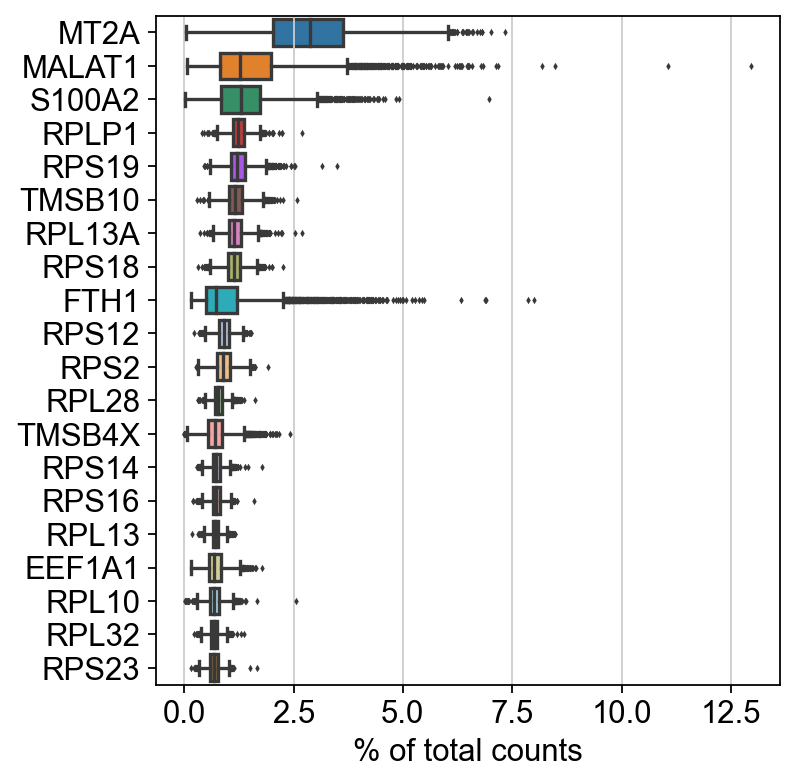

In [19]:
# Genes with largest proportions, after filtering
sc.pl.highest_expr_genes(adata, n_top=20, save=" - genes w highest expression.png")

# Save filtered genes
adata.write(dataDir+"1-Filtered_and_Normalized_allGenes.h5ad")

In [21]:
# Import cell cycle genes

# G1/S Genes
cellCycle_g1S_genes = []
with open(emtMarkerDir+cellCycle_g1S_csv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in adata.var_names:
            cellCycle_g1S_genes.append(row[0])

# G2/M Genes
cellCycle_g2M_genes = []
with open(emtMarkerDir+cellCycle_g2M_csv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in adata.var_names:
            cellCycle_g2M_genes.append(row[0])

NORMALIZATION

In [22]:
# Total-count normalize to 10,000 counts per cell
sc.pp.normalize_total(adata, target_sum=1e4)
adata.raw = adata
# Save normalized data
adata.write(dataDir+"1-Filtered_and_Normalized_allGenes.h5ad")

# Log of genes
sc.pp.log1p(adata)
# Set raw - later scanpy analysis uses this
adata.raw = adata
# Add cell cycle score
adata.X = adata.X.astype('<f8')
sc.tl.score_genes_cell_cycle(adata, s_genes=cellCycle_g1S_genes, g2m_genes=cellCycle_g2M_genes, use_raw=False)
adata.X = adata.X.astype('<f4')


/Users/meilumcd/opt/anaconda3/envs/24.03-scanpy-phate/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/Users/meilumcd/opt/anaconda3/envs/24.03-scanpy-phate/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [23]:
# Highly variable genes (note: expects log data)
sc.pp.highly_variable_genes(adata)
adataHiVar = adata[:, adata.var.highly_variable].copy()

# Regress out effects of total counts per cell and percent mito and cell cycle
sc.pp.regress_out(adataHiVar, ['total_counts', 'pct_counts_mito_gene', 'G2M_score','S_score'])

# Scale to unit variance
sc.pp.scale(adataHiVar, max_value=10)

# Save filtered and normalized data
adata.write(dataDir+"/1-Filtered_and_Normalized_hiVarGenes.h5ad")

### Part 2: CLUSTERING AND DE GENES

In [24]:
%matplotlib inline
sc.settings.set_figure_params(dpi=80, figsize=[5,5])
plt.rcParams['figure.figsize']=(5,5)

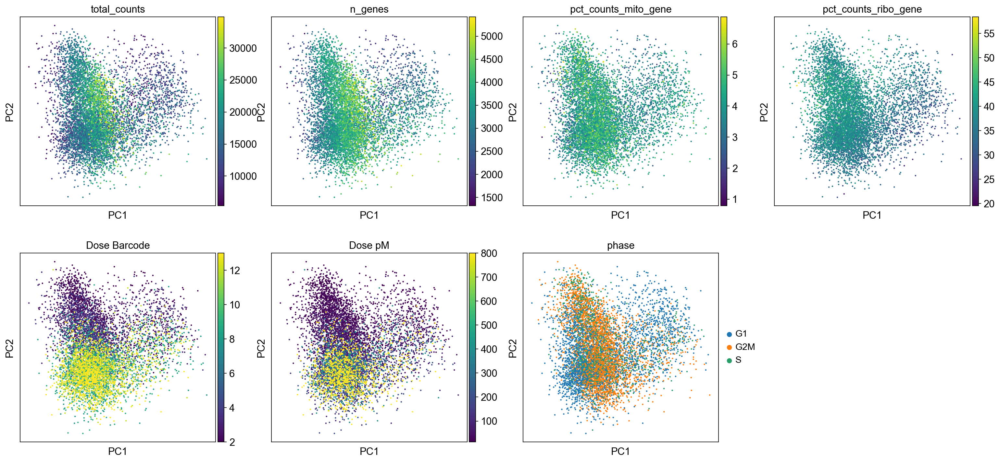

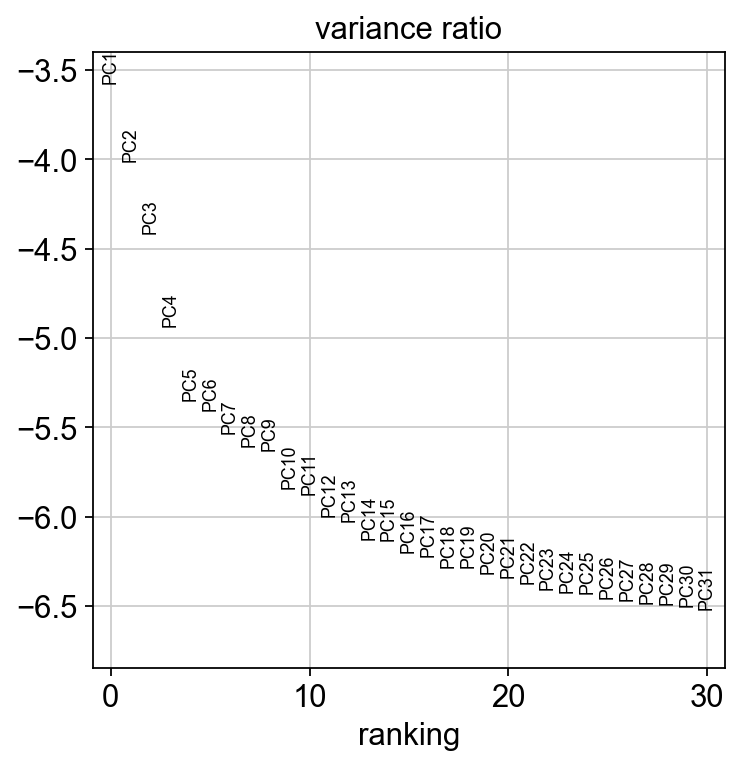

In [25]:
# PCA
sc.tl.pca(adataHiVar, svd_solver='arpack')
sc.pl.pca(adataHiVar, color=["total_counts", "n_genes", "pct_counts_mito_gene", "pct_counts_ribo_gene", "Dose Barcode", "Dose pM", "phase"], save=" - dataset info.png")
sc.pl.pca_variance_ratio(adataHiVar, log=True)

In [26]:
# UMAP
sc.pp.neighbors(adataHiVar)
sc.tl.umap(adataHiVar)

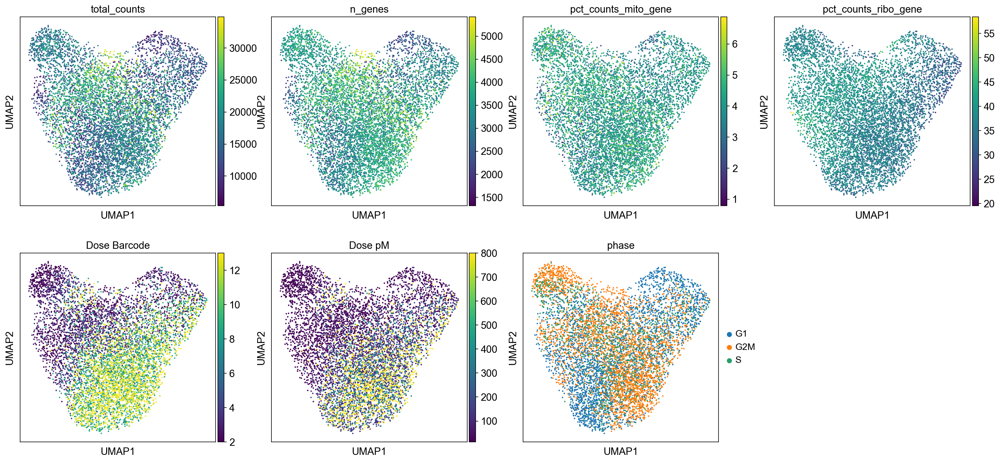

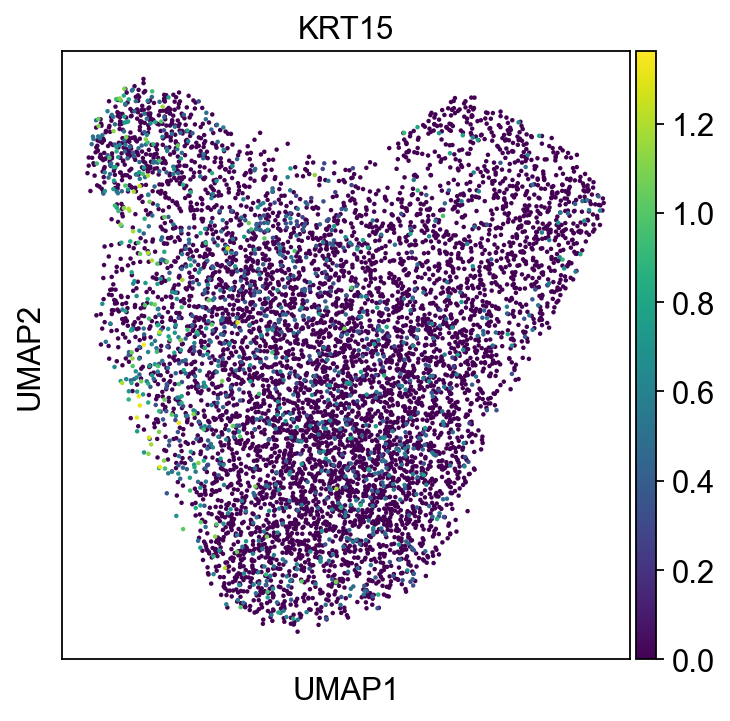

In [27]:
sc.pl.umap(adataHiVar, color=["total_counts", "n_genes", "pct_counts_mito_gene", "pct_counts_ribo_gene", "Dose Barcode", "Dose pM", "phase"], save=" - dataset info.png")
sc.pl.umap(adataHiVar, color=["KRT15"])

In [28]:
# PHATE
sc.external.tl.phate(adataHiVar)

/Users/meilumcd/opt/anaconda3/envs/24.03-scanpy-phate/lib/python3.9/site-packages/phate/phate.py:186: FutureWarning: k is deprecated. Please use knn in future.
  warnings.warn("k is deprecated. Please use knn in future.", FutureWarning)
/Users/meilumcd/opt/anaconda3/envs/24.03-scanpy-phate/lib/python3.9/site-packages/phate/phate.py:190: FutureWarning: a is deprecated. Please use decay in future.
  warnings.warn("a is deprecated. Please use decay in future.", FutureWarning)


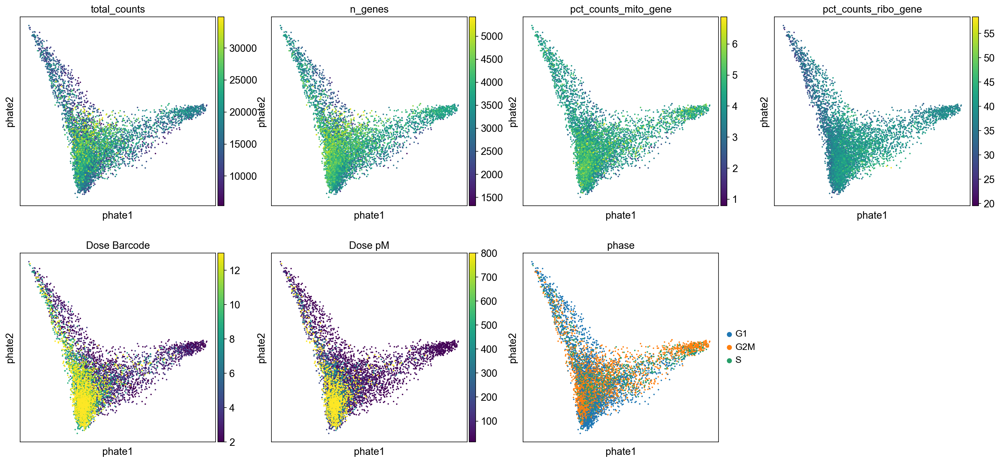

In [29]:
sc.external.pl.phate(adataHiVar, color=["total_counts", "n_genes", "pct_counts_mito_gene", "pct_counts_ribo_gene", "Dose Barcode", "Dose pM", "phase"], save=" - dataset info.png")

In [30]:
EMT_red = '#d62728'
EMT_yellow = '#ff7f0e'
EMT_blue = '#1f77b4'
colors_EMT = [EMT_yellow, EMT_blue, EMT_red]

adataHiVar.uns["leiden_colors"] = colors_EMT

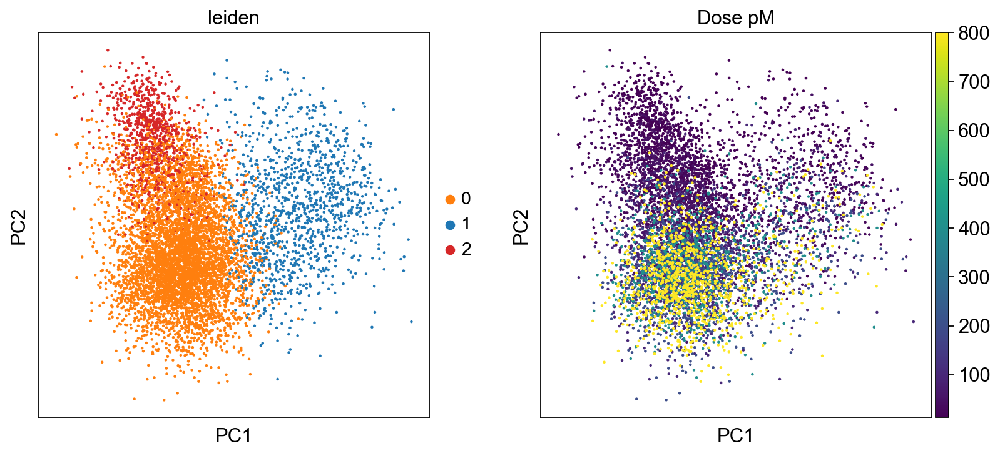

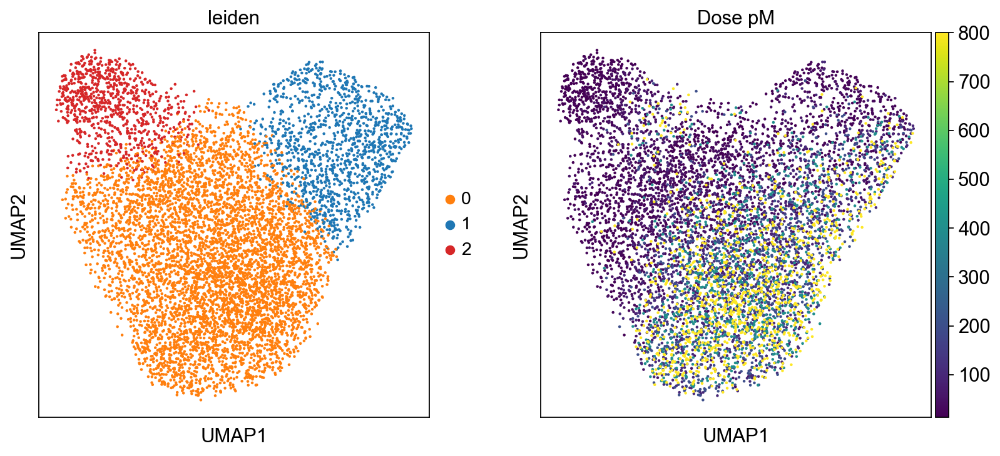

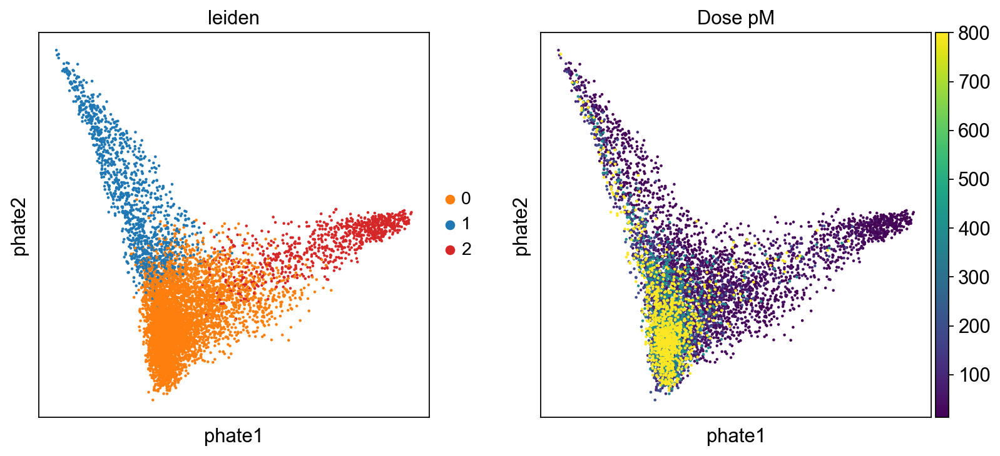

In [31]:
# Clustering

sc.tl.leiden(adataHiVar, resolution=0.2, key_added='leiden')

sc.pl.pca(adataHiVar, color=["leiden", "Dose pM"])
sc.pl.umap(adataHiVar, color=["leiden", "Dose pM"])
sc.external.pl.phate(adataHiVar, color=["leiden", "Dose pM"])

In [32]:
sc.tl.rank_genes_groups(adataHiVar, 'leiden', method='wilcoxon')
pd.DataFrame(adataHiVar.uns['rank_genes_groups']['names']).head(50).to_csv(dataSumDir+"Cluster Marker Genes.csv")
pd.DataFrame(adataHiVar.uns['rank_genes_groups']['names']).head(20)

,0,1,2
0,LAMA3,TPM2,H2AFZ
1,LAMC2,TAGLN,TUBA1B
2,ITGB6,COL1A1,HMGN2
3,COL17A1,ACTG1,PTTG1
4,ITGB4,FTH1,RAN
5,LAMB3,MYL6,YBX1
6,PLAU,DSTN,NCL
7,ITGA2,S100A6,RPSA
8,FAM83A,MYL9,HSPE1
9,FERMT1,TGFBI,HSPD1


In [33]:
# Import MSigDB genes, EMP Cook genes, and PanglaoDB E genes

df_normalized_genes = adata.var_names.to_list()
os.chdir(emtMarkerDir)

msigdbGenes = []
with open(msigdbMarkersCsv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in df_normalized_genes:
            msigdbGenes.append(row[0])

empCookGenes = []
with open(empCookMarkersCsv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in df_normalized_genes:
            empCookGenes.append(row[0])

panglaoGenes = []
with open(panglaoMarkersCsv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in df_normalized_genes:
            panglaoGenes.append(row[0])

In [34]:
os.chdir(emtMarkerDir)

intermediateDEGenes_csv = "Markers - 24.04 EMT intermediate, DE.csv"
intermediateAllGenes_csv = "Markers - 24.04 EMT intermediate focus, all analysis.csv"

intermediateDEGenes = []
with open(intermediateDEGenes_csv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in df_normalized_genes:
            intermediateDEGenes.append(row[0])
            
intermediateAllGenes = []
with open(intermediateAllGenes_csv) as inputFile:
    reader = csv.reader(inputFile)
    # no header
    for row in reader:
        if row[0] in df_normalized_genes:
            intermediateAllGenes.append(row[0])

In [35]:
os.chdir(dataSumDir)

wb = openpyxl.Workbook()
ws = wb.active
with open("Cluster Marker Genes.csv") as f:
    reader = csv.reader(f)
    for row in reader:
        ws.append(row)

# Highlight E genes (red) and M genes (blue / purple)
for row in ws.iter_rows(min_col=2, min_row=2):
    for cell in row:
        
        if cell.value in intermediateAllGenes:
            cell.fill = openpyxl.styles.PatternFill("solid", fgColor="FFD700")
        elif cell.value in intermediateDEGenes:
            cell.fill = openpyxl.styles.PatternFill("solid", fgColor="FFFF99")
        
        elif cell.value in panglaoGenes: # PanglaoDB = light red
            cell.fill = openpyxl.styles.PatternFill("solid", fgColor="D98686")
        elif cell.value in msigdbGenes: # MSigDB = light blue
            cell.fill = openpyxl.styles.PatternFill("solid", fgColor="ABC9DE")
        elif cell.value in empCookGenes: # EMP Cook = light purple
            cell.fill = openpyxl.styles.PatternFill("solid", fgColor="DABEED")

wb.save("Cluster Marker Genes - EMT colored.xlsx")
wb.close()

Stacked barplots of dose and phase, separated by cluster

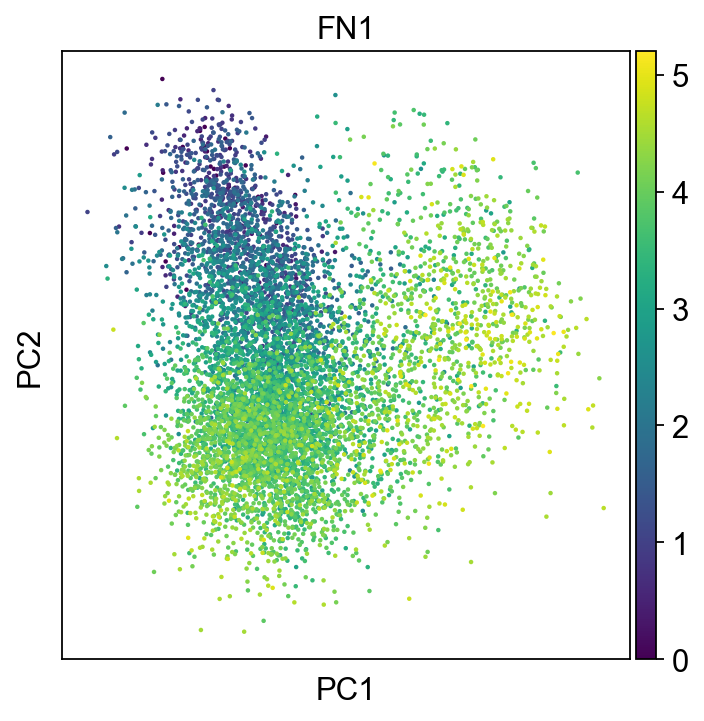

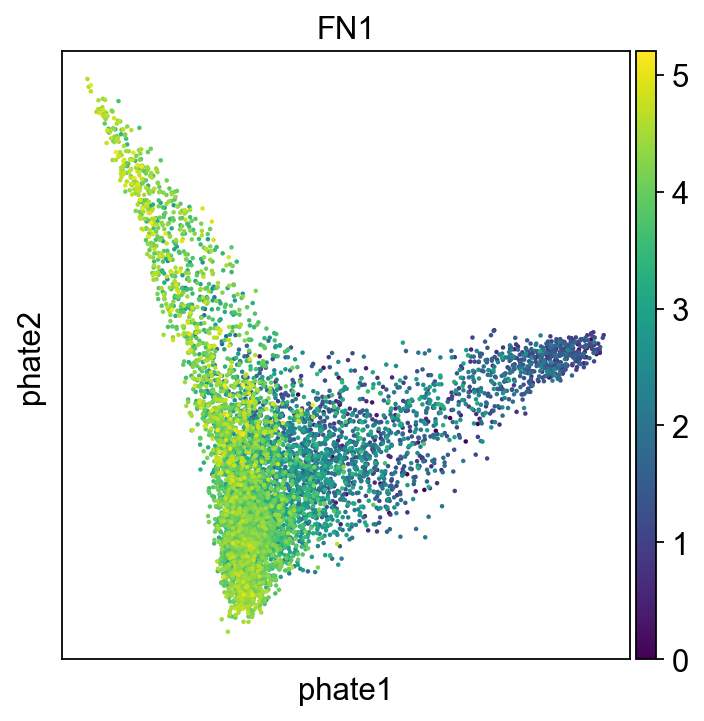

In [42]:
sc.pl.pca(adataHiVar, color=["FN1"])
sc.external.pl.phate(adataHiVar, color=["FN1"])

In [46]:
# Diffmap
sc.tl.diffmap(adataHiVar)

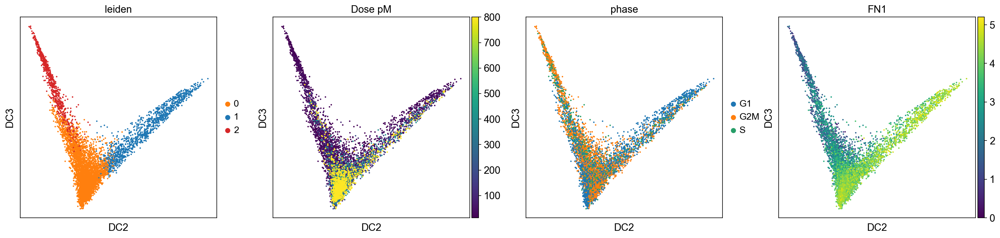

In [47]:
sc.pl.diffmap(adataHiVar, color=["leiden", "Dose pM", "phase", "FN1"], components=["2,3"])

Pseudotime

In [48]:
diffmap_dim = np.asarray([cell_dim[1] for cell_dim in adataHiVar.obsm['X_diffmap']])
root_nodes = diffmap_dim.argsort()[:5] # lowest values
# root_nodes = diffmap_dim.argsort()[-5:] # highest values

df_pseudotime = pd.DataFrame()
for curr_node in root_nodes:
    adataHiVar.uns['iroot'] = curr_node # root cell assigned
    sc.tl.dpt(adataHiVar) # calculate pseudotime using this root
    df_pseudotime["Root Node "+str(curr_node)] = adataHiVar.obs['dpt_pseudotime'].copy()

# Calculate mean per cell
df_pseudotime["Mean"] = df_pseudotime.mean(axis=1)
df_pseudotime["Cluster"] = adataHiVar.obs['leiden'].copy()
adataHiVar.obs['dpt_pseudotime_mean'] = df_pseudotime["Mean"].copy()

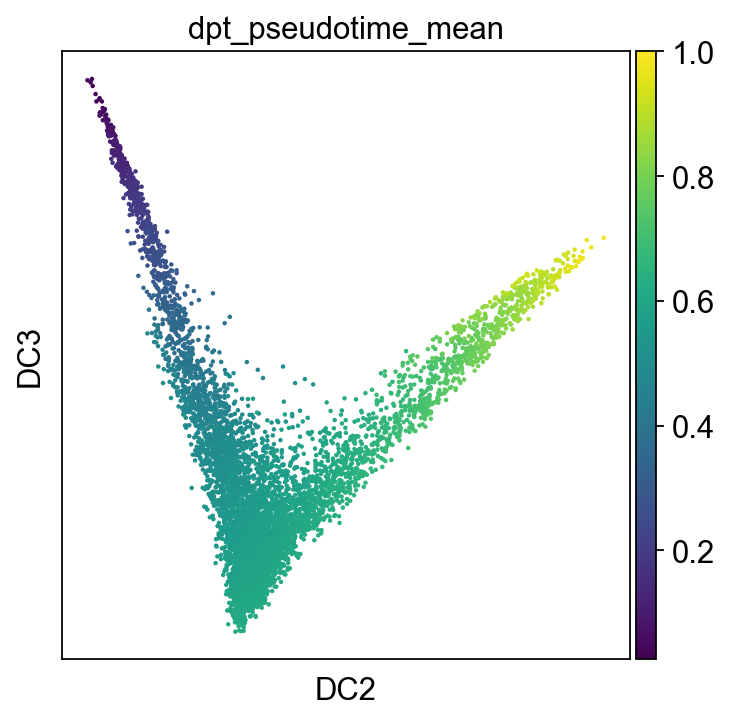

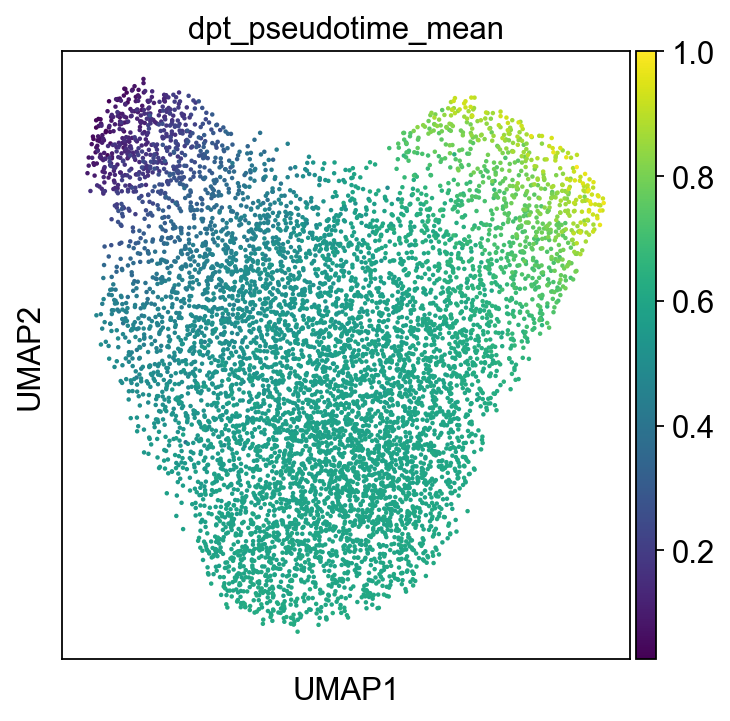

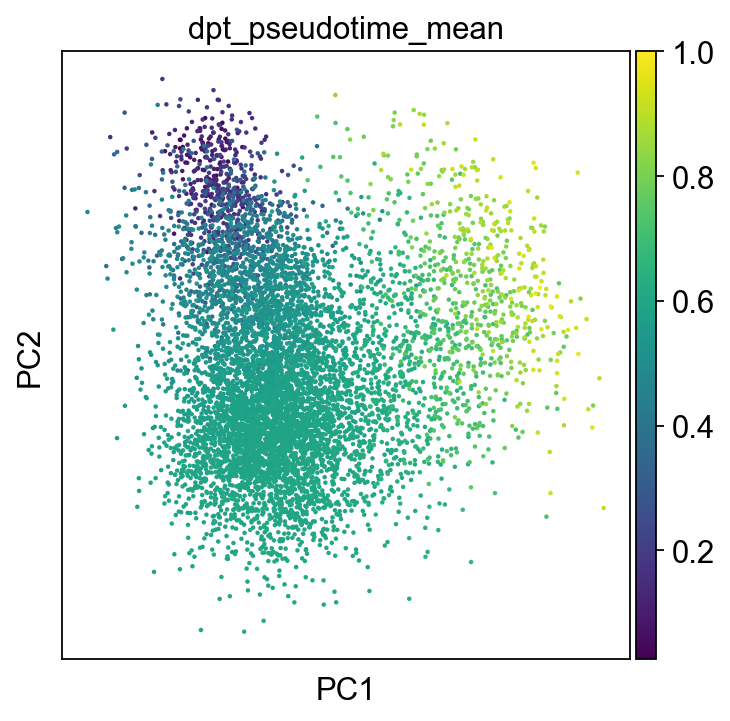

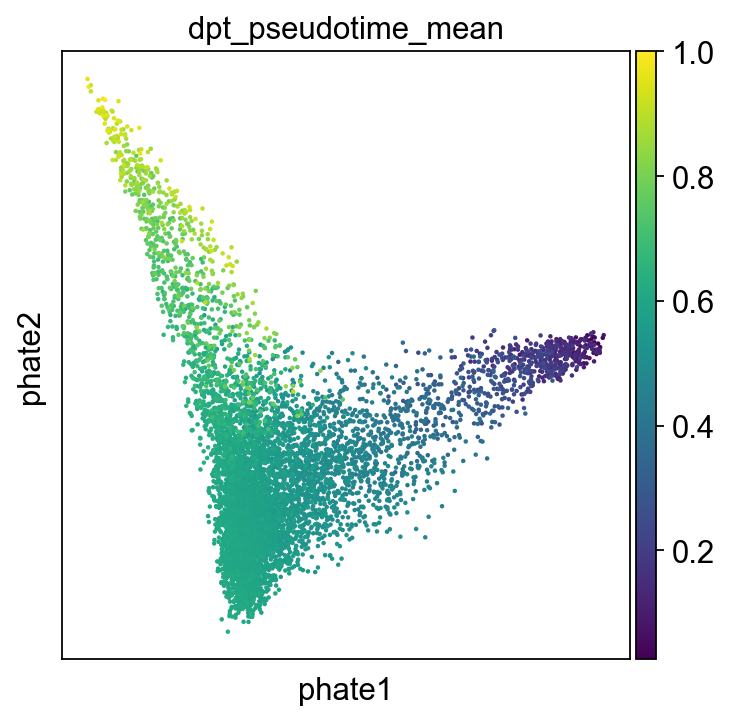

In [49]:
sc.pl.diffmap(adataHiVar, color=['dpt_pseudotime_mean'], components=('2,3'))
sc.pl.umap(adataHiVar, color=['dpt_pseudotime_mean'])
sc.pl.pca(adataHiVar, color=['dpt_pseudotime_mean'])
sc.external.pl.phate(adataHiVar, color=['dpt_pseudotime_mean'])

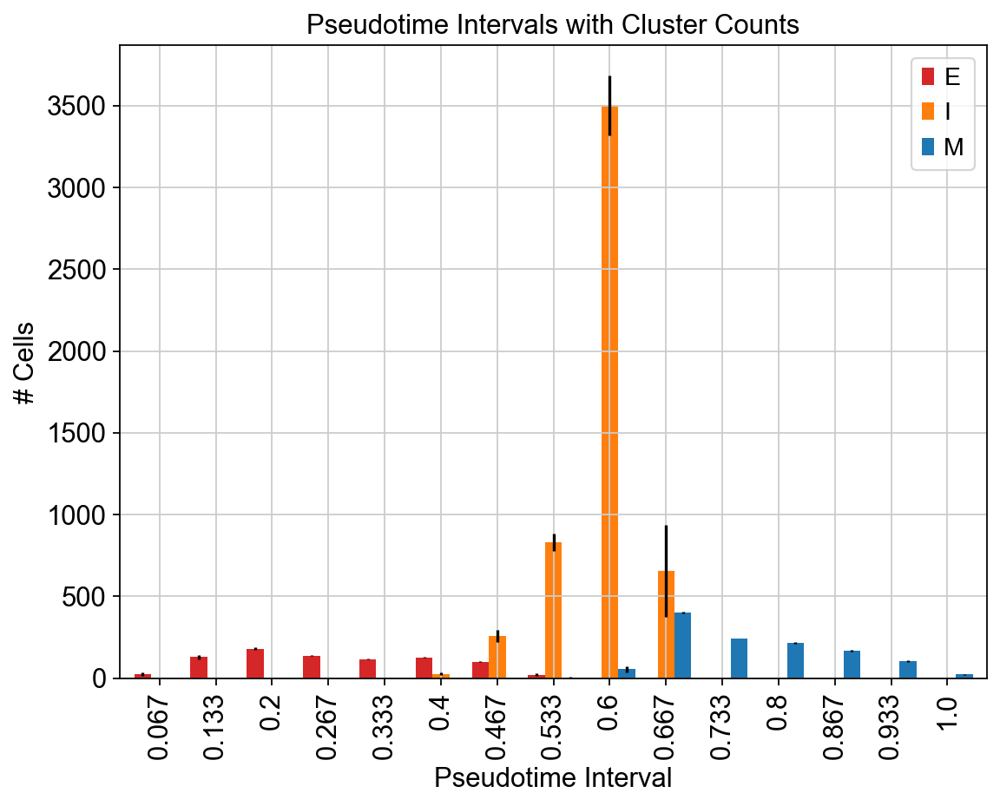

In [71]:
replacements = {'2': 'E', '0': 'I', '1': 'M'}
df_pseudotime['Cluster'] = df_pseudotime['Cluster'].replace(replacements)

EMT_clusters_in_order = [2,0,1]
run_name = ""
numBins=15
    
increments = np.linspace(0,1,numBins+1)

# Clusters with pseudotime cell numbers
root_nodes_list = df_pseudotime.columns[:-2].tolist()
numIntervals_list = list(range(0,numBins))
if len(EMT_clusters_in_order) == 3:
    df_pseudotimeClusters_mean = pd.DataFrame(columns=['E','I', 'M','Pseudotime Interval'])
    df_pseudotimeClusters_E = pd.DataFrame(index=numIntervals_list, columns=root_nodes_list)
    df_pseudotimeClusters_I = pd.DataFrame(index=numIntervals_list, columns=root_nodes_list)
    df_pseudotimeClusters_M = pd.DataFrame(index=numIntervals_list, columns=root_nodes_list)

if len(EMT_clusters_in_order) == 3:
    # Mean matrix
    for i in range(1,len(increments)):
        df_currInterval = df_pseudotime[(df_pseudotime['Mean'] <= increments[i]) & (df_pseudotime['Mean'] > increments[i-1])]
        counts_E = np.sum(df_currInterval["Cluster"] == "E")
        counts_I = np.sum(df_currInterval["Cluster"] == "I")
        counts_M = np.sum(df_currInterval["Cluster"] == "M")
        df_pseudotimeClusters_mean = pd.concat([df_pseudotimeClusters_mean,
                                                pd.DataFrame(data={'E': [counts_E],
                                                                   'I': [counts_I],
                                                                   'M': [counts_M],
                                                                   'Pseudotime Interval': [round(increments[i],3)]})],
                                               ignore_index=True)
    # Root node E, I, M matrices
    for idx, currRootNode in enumerate(df_pseudotime.columns[:-2].tolist()):
        for i in range(1,len(increments)):
            df_currInterval = df_pseudotime[(df_pseudotime[currRootNode] <= increments[i]) & (df_pseudotime[currRootNode] > increments[i-1])]
            counts_E = np.sum(df_currInterval["Cluster"] == "E")
            counts_I = np.sum(df_currInterval["Cluster"] == "I")
            counts_M = np.sum(df_currInterval["Cluster"] == "M")
            df_pseudotimeClusters_E.iat[i-1, idx] = counts_E
            df_pseudotimeClusters_I.iat[i-1, idx] = counts_I
            df_pseudotimeClusters_M.iat[i-1, idx] = counts_M
    # Root node E, I1, I2, M matrices; standard deviation of # cells in each pseudotime interval
    df_pseudotimeClusters_stdev = pd.DataFrame()
    df_pseudotimeClusters_stdev["E"] = df_pseudotimeClusters_E.std(axis=1)
    df_pseudotimeClusters_stdev["I"] = df_pseudotimeClusters_I.std(axis=1)
    df_pseudotimeClusters_stdev["M"] = df_pseudotimeClusters_M.std(axis=1)


# Plot figure with cell numbers
if len(EMT_clusters_in_order) == 4:
    colors_EMT_rainbow = ['#d62728', '#ff7f0e', '#279e68', '#1f77b4'] #ROGB
    y_plot = ["E","I1","I2","M"]
elif len(EMT_clusters_in_order) == 3:
    colors_EMT_rainbow = ['#d62728', '#ff7f0e', '#1f77b4'] #ROB
    y_plot = ["E","I","M"]


df_pseudotimeClusters_mean.reset_index().plot(x="Pseudotime Interval", y=y_plot,
                                              yerr=[df_pseudotimeClusters_stdev[col] for col in df_pseudotimeClusters_stdev],
                                              kind="bar", width=0.9, figsize=(8,6),
                                              color=colors_EMT_rainbow)
plt.ylim(bottom=0)
plt.title("Pseudotime Intervals with Cluster Counts");
plt.ylabel("# Cells");
plt.savefig(figDir+"Pseudotime Intervals by Cluster - "+str(numBins)+" bins.png")
plt.show()

<Figure size 400x400 with 0 Axes>

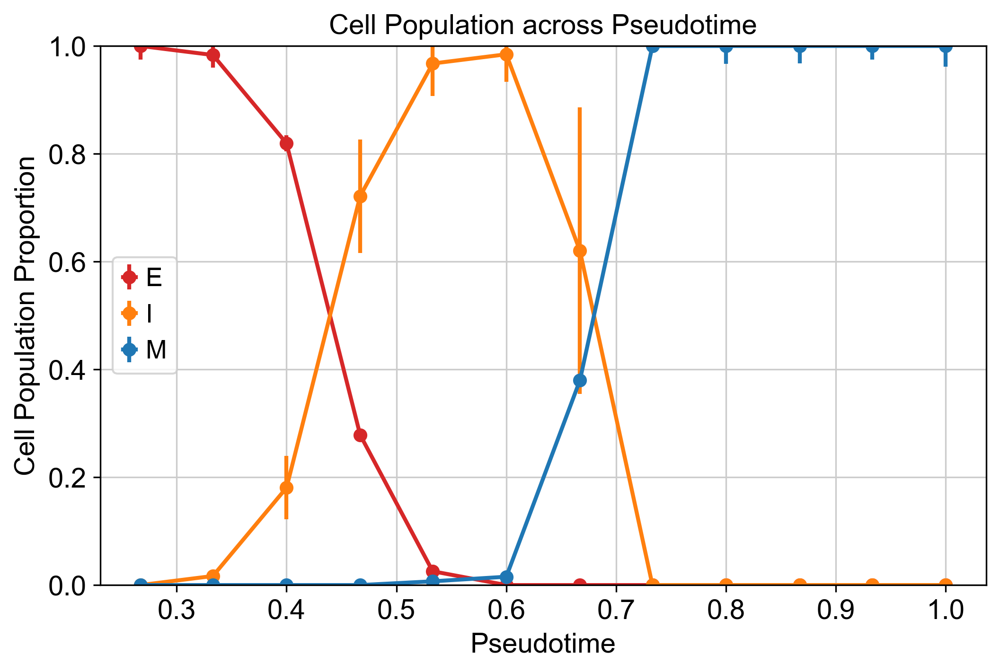

In [72]:
# Calculate by proportions per interval instead of numbers
df_pseudotimeClusters_proportions = df_pseudotimeClusters_mean.iloc[:,:-1].copy()
numCells_per_interval = df_pseudotimeClusters_proportions.sum(axis=1)

# df_pseudotimeClusters_proportions = df_pseudotimeClusters_proportions.div(numCells_per_interval, axis=0)
df_pseudotimeClusters_proportions = df_pseudotimeClusters_proportions.div(numCells_per_interval.replace(0.0,1.0), axis=0)
df_pseudotimeClusters_proportions["Pseudotime Interval"] = df_pseudotimeClusters_mean["Pseudotime Interval"].copy()

# Trim, starting from last bin with 100% E cells
# model_start_bin = max(0, pd.Series(df_pseudotimeClusters_proportions[df_pseudotimeClusters_proportions.columns[0]].astype(float) < 1.0).argmax() - 1)
model_start_bin = max(0, df_pseudotimeClusters_proportions.iloc[:,0][df_pseudotimeClusters_proportions.iloc[:,0] == 1.0].index[-1])
df_pseudotimeClusters_proportions = df_pseudotimeClusters_proportions[model_start_bin:]

# Convert standard deviation # cells into proportions
df_pseudotimeClusters_stdev_proportions = pd.DataFrame()
df_pseudotimeClusters_stdev_proportions["E"] = (df_pseudotimeClusters_stdev["E"] / numCells_per_interval).fillna(0)[model_start_bin:]
df_pseudotimeClusters_stdev_proportions["I"] = (df_pseudotimeClusters_stdev["I"] / numCells_per_interval).fillna(0)[model_start_bin:]
df_pseudotimeClusters_stdev_proportions["M"] = (df_pseudotimeClusters_stdev["M"] / numCells_per_interval).fillna(0)[model_start_bin:]

plt.clf()
plt.figure(figsize=(8, 5), dpi=150)
plt.errorbar(df_pseudotimeClusters_proportions["Pseudotime Interval"], df_pseudotimeClusters_proportions["E"],
             yerr = df_pseudotimeClusters_stdev_proportions["E"], fmt='-o', color="C3", lw=2)
plt.errorbar(df_pseudotimeClusters_proportions["Pseudotime Interval"], df_pseudotimeClusters_proportions["I"],
             yerr = df_pseudotimeClusters_stdev_proportions["I"], fmt='-o', color="C1", lw=2)
plt.errorbar(df_pseudotimeClusters_proportions["Pseudotime Interval"], df_pseudotimeClusters_proportions["M"],
             yerr = df_pseudotimeClusters_stdev_proportions["M"], fmt='-o', color="C0", lw=2)
plt.legend(["E", "I", "M"], loc="center left")
plt.xlabel("Pseudotime")
plt.ylabel("Cell Population Proportion")
plt.title("Cell Population across Pseudotime")
plt.ylim(0,1);
plt.savefig(figDir+"Pseudotime Intervals by Cluster - "+str(numBins)+" bins, Cell Proportions.png")
plt.show()

In [78]:
odeDir = mainDir+"/ODE Model/Data/6-Panchy/"
run_name = "Panchy"

In [79]:
# Save ODE data
del df_pseudotimeClusters_proportions["Pseudotime Interval"]
os.chdir(odeDir)
df_pseudotimeClusters_proportions.to_csv(run_name+" - Pseudotime - "+str(numBins)+" bins, cropped.csv")
df_pseudotimeClusters_stdev_proportions.to_csv(run_name+" - Pseudotime - "+str(numBins)+" bins, cropped, stdev.csv")